#IMPORT ALL DEPENDENCIES


In [ ]:
import numpy as np
import pandas as pd
from skimage import io
import cv2
from sklearn.model_selection import train_test_split, KFold
from sklearn.utils import shuffle
from scipy.io import loadmat

import tensorflow
from tensorflow import keras
from tensorflow import cast
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import AUC
from tensorflow.keras.applications import vgg16
from tensorflow.keras.applications import inception_v3
from keras.utils.vis_utils import plot_model

import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix
import gc
import os

#LOADING DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
IMAGE_HEIGHT=256
IMAGE_WIDTH=256
SAVE_MODEL_PATH = "/content/drive/MyDrive/CV/models/"
SAVE_FILE_PATH = "/content/drive/MyDrive/CV/model_plots/"

In [ ]:
# loading previously stored training and test data
x_train = np.load('/content/drive/MyDrive/CV/train_images.npy')
y_train = np.load('/content/drive/MyDrive/CV/train_labels.npy', allow_pickle=True)
x_test = np.load('/content/drive/MyDrive/CV/test_images.npy')
y_test = np.load('/content/drive/MyDrive/CV/test_labels.npy', allow_pickle=True)

In [ ]:
# loading names of the labels
label_name = pd.read_csv('/content/drive/MyDrive/CV/label_names.csv', names=['classes'])
label_name = label_name.values[:, 0]

In [ ]:
# confirming train-test split
y_test.shape, y_train.shape

((500, 51), (4500, 51))

In [ ]:
# ratio of each of the label in train and test
np.sum(y_train, axis=0)/np.sum(y_test, axis=0)

array([9.014545 , 6.7777777, 8.672728 , 8.6470585, 9.066667 , 9.176471 ,
       8.933333 , 9.111111 , 9.       , 9.055555 , 8.869565 , 9.       ,
       8.05     , 9.222222 , 9.       , 8.818182 , 8.727273 , 8.894737 ,
       8.533334 , 9.055555 , 8.923077 , 9.222222 , 9.       , 8.461538 ,
       9.       , 8.375    , 9.133333 , 7.8717947, 8.918919 , 8.928572 ,
       8.823529 , 7.2      , 8.724138 , 8.533334 , 7.428571 , 7.9836063,
       8.2      , 9.15     , 8.388889 , 9.063829 , 8.714286 , 8.944445 ,
       6.9473686, 7.1875   , 6.2      , 8.65     , 9.3      , 7.304348 ,
       7.571429 , 9.238095 , 8.9375   ], dtype=float32)

In [ ]:
# frequency of each of the class
freq = np.sum(y_train, axis=0)

# CREATING NEURAL NETWORKS

In [ ]:
'''
function to get the head model for our model
can use VGG16, InceptionV3, ResNet152V2 or NAS Net Large
by default we will use pretrained weights from ImageNet dataset
'''
def getBaseModel(modelName, pretrained=True):
    if modelName == "VGG16":
        if pretrained:
            baseModel = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = VGG16(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "InceptionV3":
        if pretrained:
            baseModel = InceptionV3(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = InceptionV3(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "ResNet152V2":
        if pretrained:
            baseModel = ResNet152V2(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = ResNet152V2(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    elif modelName == "NasNetLarge":
        if pretrained:
            baseModel = NasNetLarge(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = NasNetLarge(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    else:
        raise Exception("Model not supported.")

    return baseModel

In [ ]:
'''
function to generate the model
gets the desired base model from modelName
adds a dropout after flatten 
the last layer wull contain num_classes no. of units
denseUnits contain the list of units - (length of denseUnits is the no. of dense layers we want to add with value at each index signifying no. of units in each layer)
'''
def generateModel(modelName, pretrained=True, dropout=0.5, num_classes=51, denseUnits=[256]):
    baseModel = getBaseModel(modelName, pretrained)

    # the output of baseModel
    headModel = baseModel.output

    # Adding trainable layers in front
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dropout(dropout)(headModel)
    for i in denseUnits:
        headModel = Dense(i, activation="relu")(headModel)

    # using sigmoid in last layer because output is multi-label
    headModel = Dense(num_classes, activation="sigmoid")(headModel)
    
    # Use pretrained weights
    if pretrained:
        for layer in baseModel.layers:
            layer.trainable = False
    model = Model(inputs=baseModel.input, outputs=headModel)
    fileName = SAVE_FILE_PATH + "model_plot_" + modelName + ".png"
    plot_model(model, to_file=fileName, show_shapes=True, show_layer_names=True)
    return model

In [ ]:
'''
function to train the model - uses Adam as optimizer and binary crossentropy as loss function
x, y - training data and labels
lrate - learning rate for Adam
batch_size - the size of the batch
epochs - no. of epochs
model - the model to train
modelName - the name of the model (for saving purposes)
class_weights - the weights for each class
earlyStopping - whether to use EarlyStopping callback or not
'''
def train(x, y, lrate, batch_size, epochs, model, modelName, class_weights, earlyStopping=True):
    optimizer = Adam(learning_rate=lrate)
    model.compile(optimizer=optimizer,
                    loss="binary_crossentropy",
                    metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
    
    #model save at checkpoint callback
    checkpoint = ModelCheckpoint(os.path.join(SAVE_MODEL_PATH, modelName), monitor= 'auc', mode= 'max', save_best_only=True, save_weights_only=True, verbose= 1)

    #early stopping callback
    if earlyStopping:
        es_cb = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights, batch_size=batch_size, verbose=1, callbacks=[es_cb])
    else:
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights,batch_size=batch_size, verbose=1)
    
    keras.backend.clear_session()
    gc.collect()
    model.save_weights(os.path.join(SAVE_MODEL_PATH,"finalModel" + modelName + ".h5"))
    del model
    return history

In [ ]:
# Using Inception-V3
x_train = inception_v3.preprocess_input(x_train)
model = generateModel("InceptionV3", dropout=0.70, num_classes=51, denseUnits=[256])
model.summary()

87924736/87910968 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 127, 127, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 127, 127, 32  96         ['conv2d[0][0]']                 
 alization)                  

In [ ]:
# class weights 
class_weights = {}
for i in range(y_train.shape[1]):
    # class weights = 1/sqrt(frequency of class)
    val = np.sum(y_train, axis=0)[i]
    class_weights[i] = 1/(np.sqrt(val))

# reducing the weight for person class
class_weights[0] *= 0.5
class_weights

{0: 0.010042266209236046,
 1: 0.09053574974745077,
 2: 0.04578685369346279,
 3: 0.08247861217552505,
 4: 0.08574929557377618,
 5: 0.08006407716136342,
 6: 0.08638684082287697,
 7: 0.0637576710393699,
 8: 0.09622504879958661,
 9: 0.07832604609047276,
 10: 0.07001400378896204,
 11: 0.08908708372542402,
 12: 0.07881103993118946,
 13: 0.07761505088432184,
 14: 0.09622504879958661,
 15: 0.10153461571086121,
 16: 0.07216878494400528,
 17: 0.07692307692307693,
 18: 0.0625,
 19: 0.07832604609047276,
 20: 0.09284767028564815,
 21: 0.07761505088432184,
 22: 0.1005037860391621,
 23: 0.09534625777831769,
 24: 0.08606629768227989,
 25: 0.08638684082287697,
 26: 0.08543576865067794,
 27: 0.05707301376358713,
 28: 0.05504819110632702,
 29: 0.0894427196941238,
 30: 0.08164965671085447,
 31: 0.09622504879958661,
 32: 0.06286946247717587,
 33: 0.0883883491610206,
 34: 0.09805806730288975,
 35: 0.045314324217711484,
 36: 0.07808687978582586,
 37: 0.0739221281713273,
 38: 0.08137884340678914,
 39: 0.04845

#TRAINING

In [ ]:
# epochs, learning rate and batch-size for training
epochs = 40
lrate = 1e-3
batch_size = 64

history = train(x_train, y_train, lrate, batch_size, epochs, model, "InceptionV3", class_weights, earlyStopping=False)

Epoch 1/40
71/71 [==============================] - 48s 432ms/step - loss: 0.0171 - auc: 0.6544 - precision: 0.2966 - recall: 0.2601
Epoch 2/40
71/71 [==============================] - 29s 412ms/step - loss: 0.0042 - auc: 0.8152 - precision: 0.5844 - recall: 0.3932
Epoch 3/40
71/71 [==============================] - 29s 411ms/step - loss: 0.0031 - auc: 0.8595 - precision: 0.6635 - recall: 0.4742
Epoch 4/40
71/71 [==============================] - 29s 410ms/step - loss: 0.0025 - auc: 0.8886 - precision: 0.7074 - recall: 0.5416
Epoch 5/40
71/71 [==============================] - 29s 410ms/step - loss: 0.0022 - auc: 0.9047 - precision: 0.7323 - recall: 0.5777
Epoch 6/40
71/71 [==============================] - 29s 411ms/step - loss: 0.0019 - auc: 0.9196 - precision: 0.7521 - recall: 0.6209
Epoch 7/40
71/71 [==============================] - 29s 411ms/step - loss: 0.0017 - auc: 0.9324 - precision: 0.7676 - recall: 0.6420
Epoch 8/40
71/71 [==============================] - 29s 411ms/step - 

#TESTING AND METRICS

In [ ]:
# the function to plot metrics
def plotMetrics(history):
    plt.plot(history["auc"])
    plt.plot(history["precision"])
    plt.plot(history["recall"])
    plt.title("Model Accuracy")
    plt.xlabel("epoch")
    plt.ylabel("metric")
    plt.legend(["AUC","Precision", "Recall"], loc="best")
    plt.show()

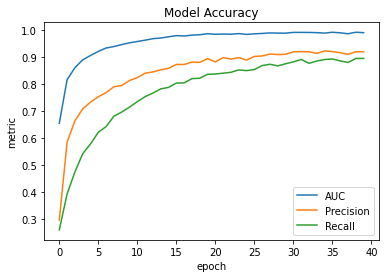

In [ ]:
plotMetrics(history.history)

In [ ]:
# function to get the label from prediction
# based on the confidence the prediction is made
def getLabels(preds, confidence):
  result = []
  for pred in preds:
    res = []
    for i, prob in enumerate(pred):
      # predicted probability should be greater than confidence value to include in final result
      if prob > confidence:
          res.append(label_name[i])
    result.append(res)
  return result

In [ ]:
# preprocessing the test data
test_pred = model.predict(inception_v3.preprocess_input(np.array(x_test,dtype=np.float32)))

In [ ]:
# metrics obtained for test data
optimizer = Adam(learning_rate=lrate)
model.compile(metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
eval = model.evaluate(inception_v3.preprocess_input(np.array(x_test,dtype=np.float32)), y_test)

16/16 [==============================] - 7s 233ms/step - loss: 0.0000e+00 - auc: 0.7713 - precision: 0.6457 - recall: 0.4797


In [ ]:
gc.collect()

94562

In [ ]:
# function to diplay results for training data, confidence set to 0.5
def show_result_train(idx, conf=0.5):
    plt.imshow(x_org[idx].astype(np.uint8))
    print(getLabels(train_pred, conf)[idx])

# function to diplay results for testing data, confidence set to 0.5
def show_result_test(idx, conf=0.5):
    plt.imshow(x_test[idx].astype(np.uint8))
    print(getLabels(test_pred, conf)[idx])

['person', 'tie']


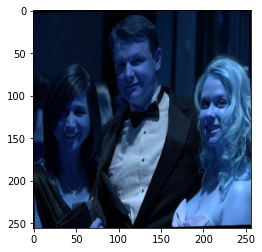

['car', 'bus', 'traffic light']


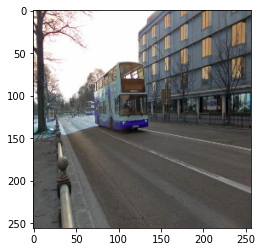

['bed']


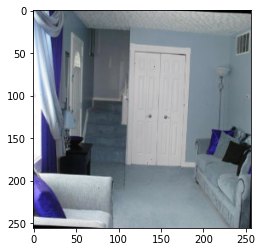

['toilet', 'sink']


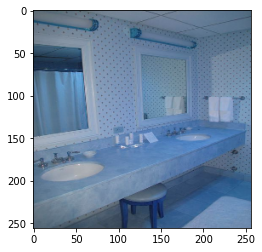

['person']


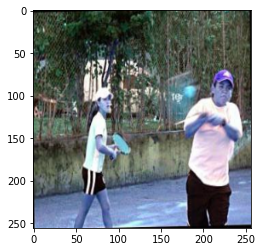

['cup', 'fork', 'dining table']


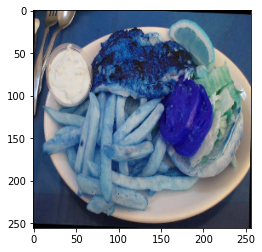

['person', 'boat']


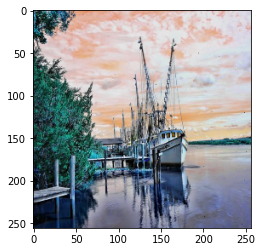

['person', 'cell phone']


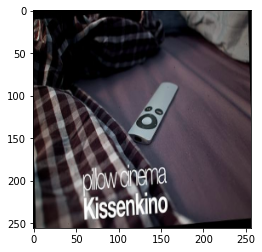

['airplane']


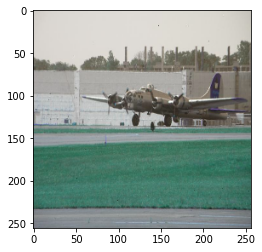

['toilet']


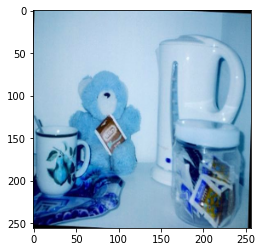

['person', 'dog']


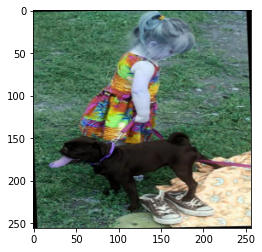

['cat']


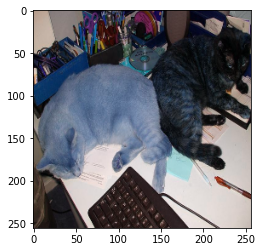

['person', 'cup', 'knife', 'bowl', 'chair', 'dining table']


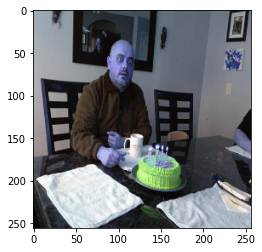

['spoon', 'bowl', 'dining table']


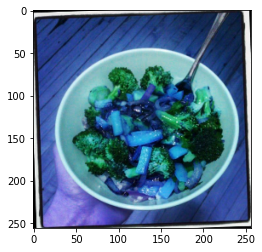

['person']


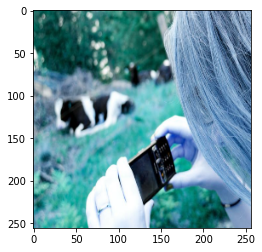

['airplane', 'truck']


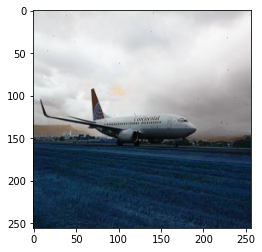

['person', 'motorcycle']


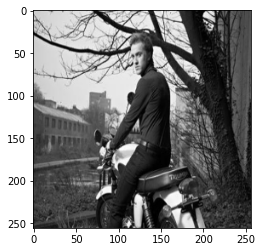

[]


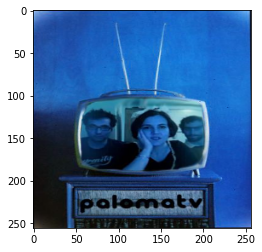

['person', 'chair']


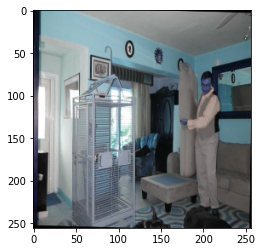

['person', 'boat', 'chair']


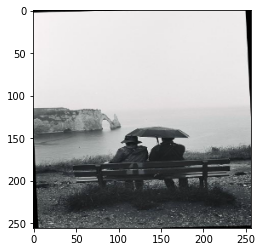

['person', 'tie']


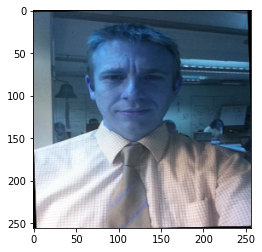

['cell phone']


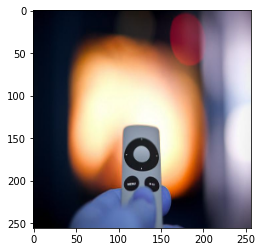

['person', 'car', 'traffic light', 'backpack', 'umbrella', 'handbag']


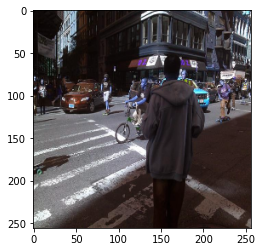

['person', 'baseball bat', 'baseball glove']


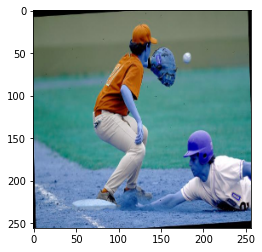

['person', 'skis']


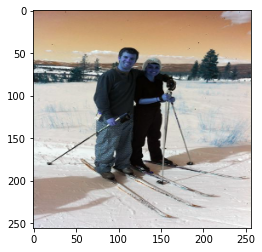

['person']


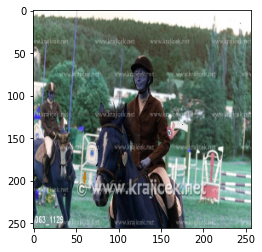

[]


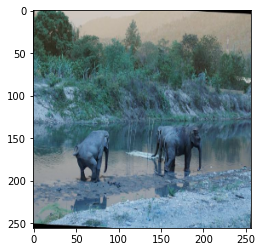

['person', 'bottle', 'cup', 'chair', 'tv', 'remote', 'book']


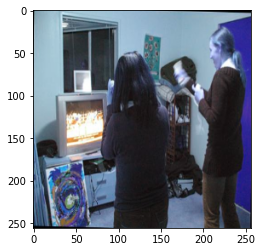

['person']


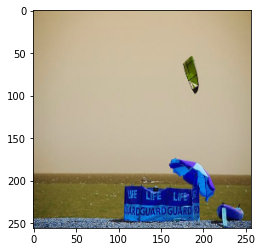

['person', 'chair', 'dining table']


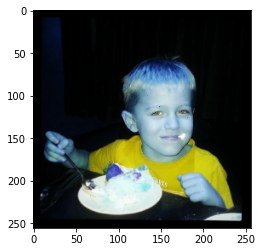

['toilet', 'sink']


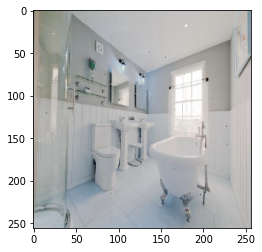

['person', 'cup', 'fork', 'knife', 'spoon', 'chair', 'dining table', 'book', 'vase']


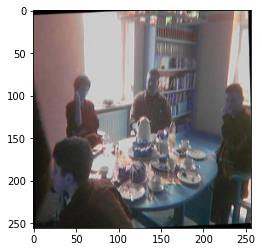

['person', 'baseball bat', 'baseball glove']


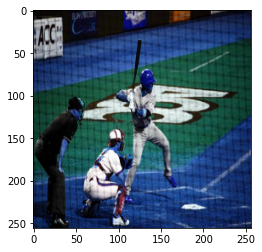

[]


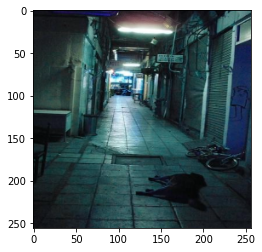

[]


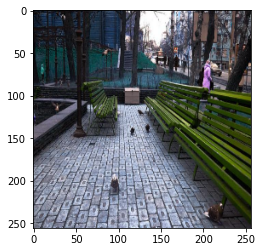

['person', 'baseball bat', 'skateboard']


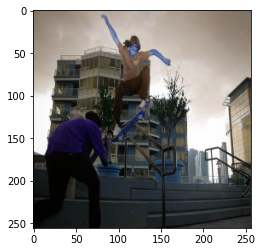

['train']


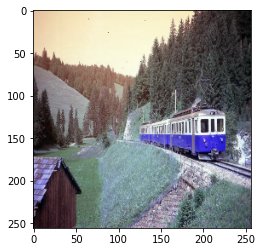

['person', 'baseball glove']


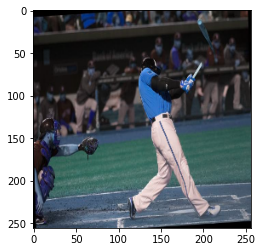

[]


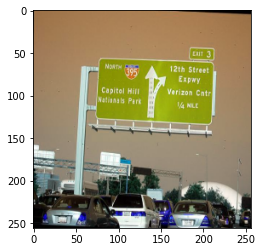

['person', 'skis']


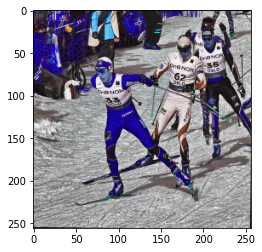

['person', 'dining table']


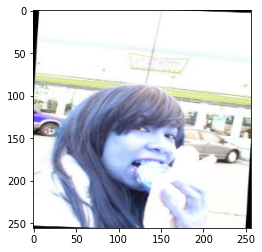

['cat']


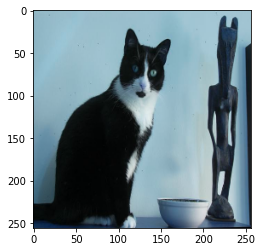

['person', 'horse']


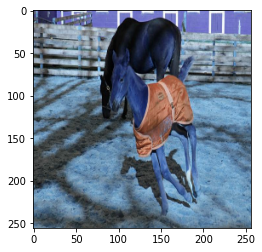

['dining table']


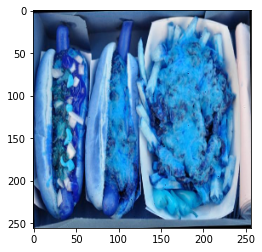

[]


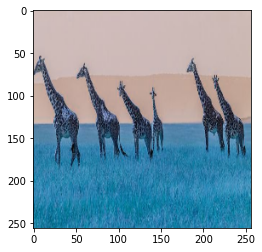

['toilet']


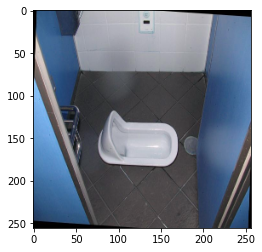

['person', 'bench']


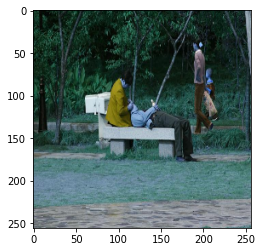

[]


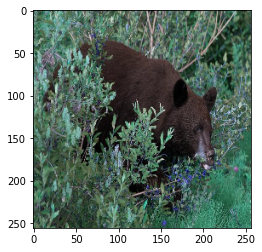

['person', 'chair', 'book']


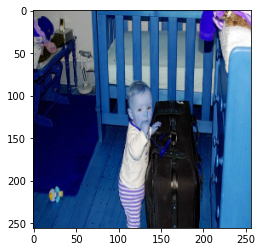

['person']


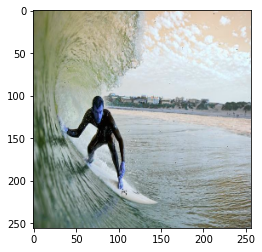

['person', 'bottle', 'cup', 'knife', 'spoon', 'bowl', 'oven', 'sink']


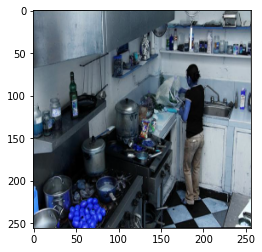

['person', 'handbag']


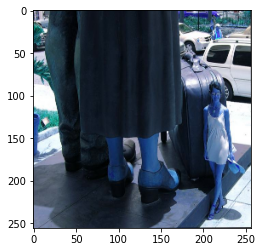

['person', 'surfboard']


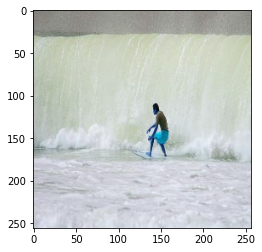

['person', 'cell phone']


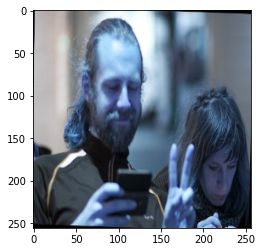

['person', 'baseball glove']


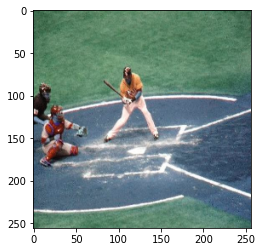

[]


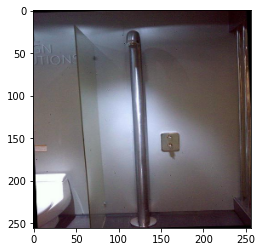

['toilet', 'sink']


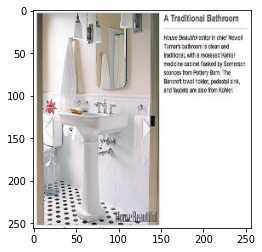

['person', 'bottle', 'cup']


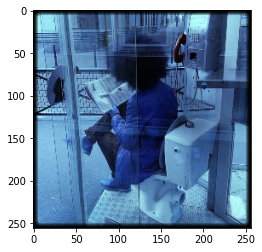

[]


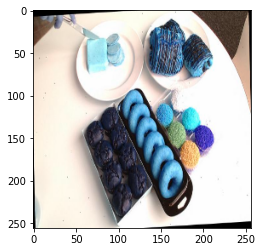

['person', 'tennis racket']


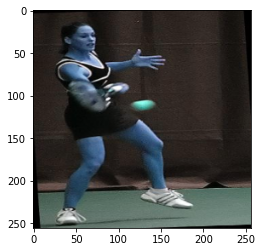

[]


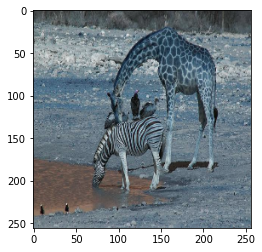

['person']


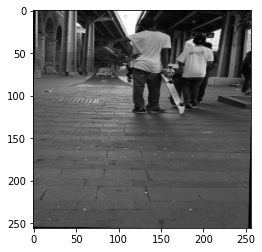

[]


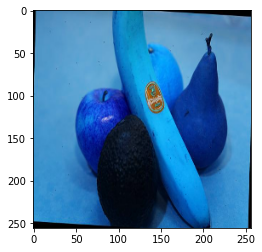

[]


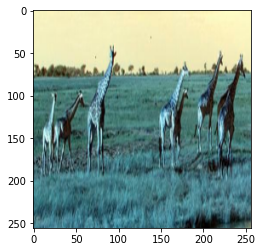

['bed']


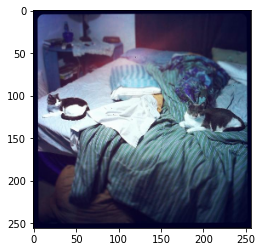

['person', 'bottle', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'dining table']


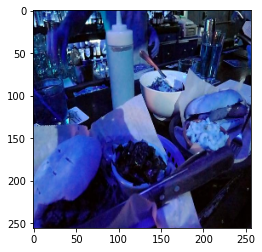

['person', 'bus']


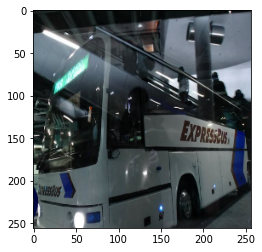

['person', 'train']


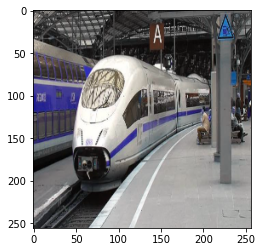

['toilet']


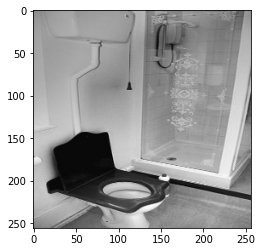

['person', 'dog', 'baseball bat']


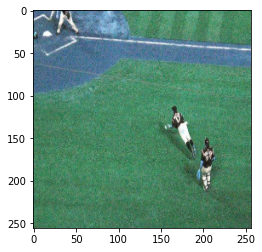

['person', 'motorcycle']


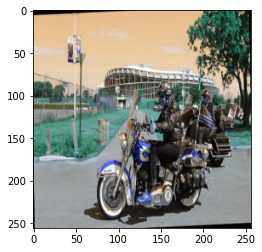

['person', 'chair', 'couch']


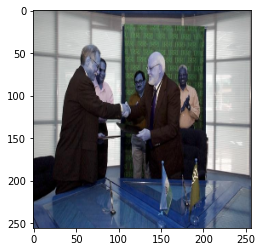

['person', 'handbag', 'tie', 'cell phone']


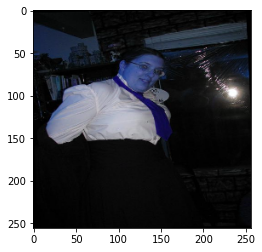

['traffic light']


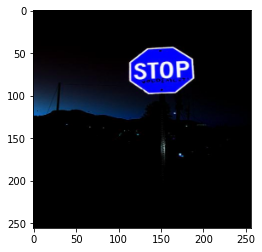

['person', 'cell phone']


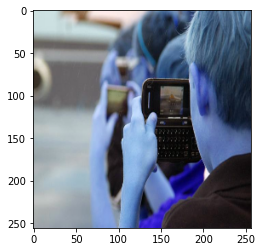

['person', 'bicycle']


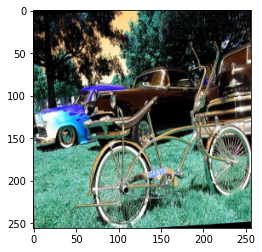

['person']


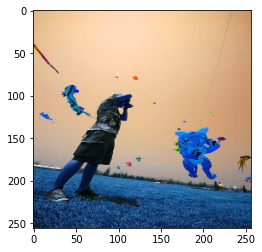

[]


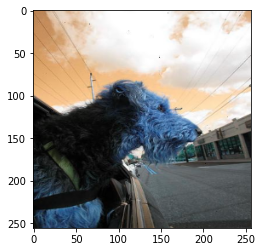

['airplane']


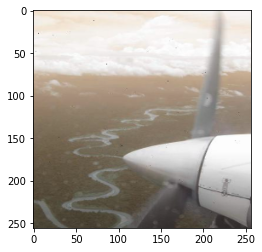

['motorcycle']


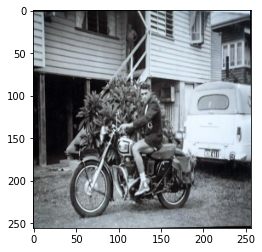

['truck']


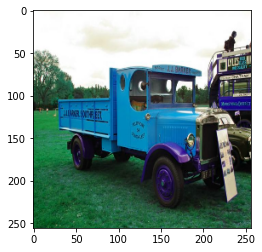

['person', 'cat', 'book']


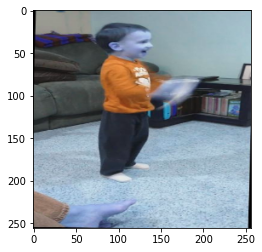

[]


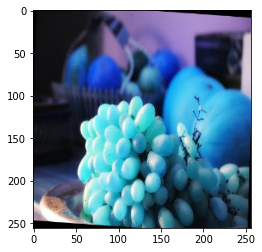

['person', 'bench']


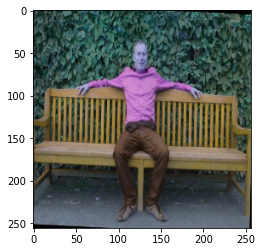

['clock']


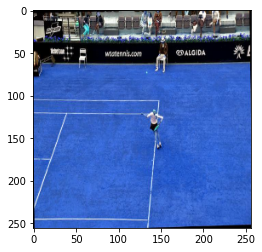

['keyboard']


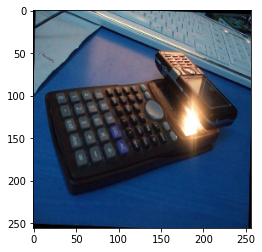

['person', 'bowl']


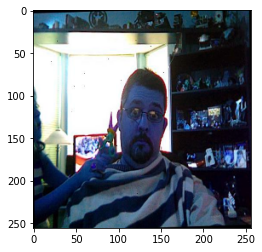

['person', 'cell phone']


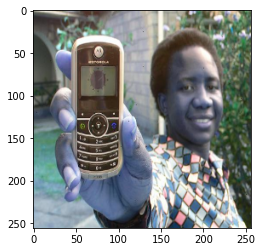

['truck']


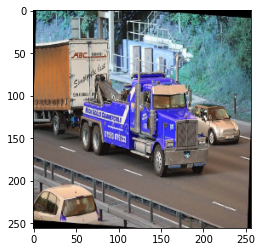

['person']


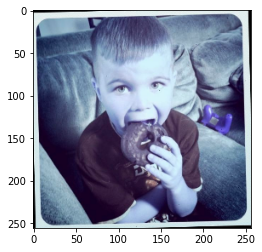

[]


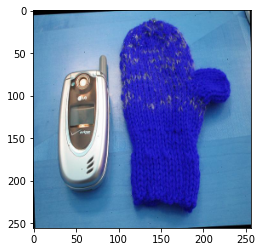

['car']


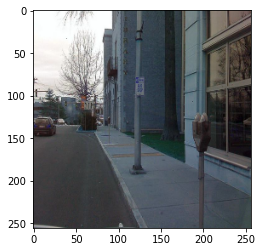

['person', 'dog', 'chair', 'dining table']


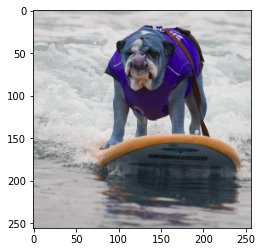

['chair']


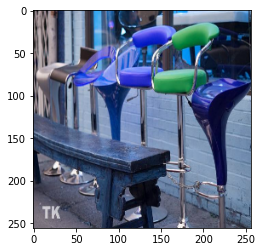

['bowl']


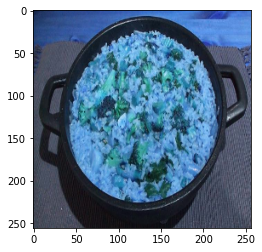

['umbrella']


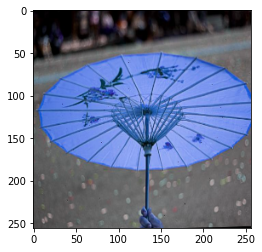

['person']


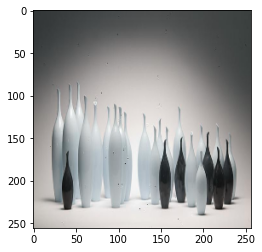

['cat', 'tv', 'laptop', 'keyboard']


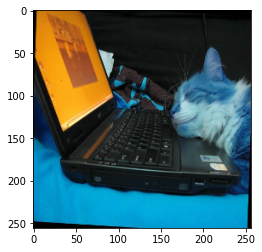

[]


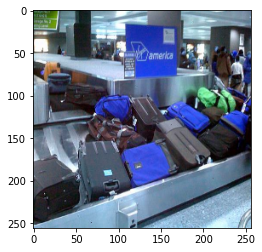

['cat']


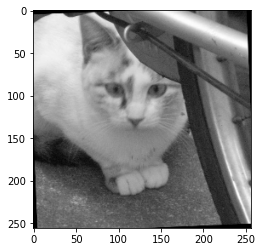

In [ ]:
# randomly choosing 100 images and displaying the results
import random
ran_nums = random.sample(range(500), 100)
for i in ran_nums:
  show_result_test(i)
  plt.show()